# Testing of Car detection

This notebook test car detection models against images and videos

### Importing necessary libraries

In [1]:
import os

# If GPU (cuda) is not available or configured, uncomment following line
# Caution: Processing will be slow on CPU

os.environ["CUDA_VISIBLE_DEVICES"] = "-1"

In [2]:
# Some libs may be unnecessary
# todo: Cleanup
import tensorflow as tf

import numpy as np
import matplotlib.pyplot as plt
import os

from PIL import Image, ImageDraw
from tensorflow.keras.layers import Input, Dense, Flatten, Conv2D, MaxPool2D, BatchNormalization, Dropout
from tensorflow.keras.layers import GlobalMaxPooling2D, ZeroPadding2D, Activation, MaxPooling2D, Add, AveragePooling2D
from keras.initializers import glorot_uniform


import pandas as pd 
import numpy as np 
import cv2 as cv

import albumentations as A
import random

#### Global Parameters

Defaily image length, Overlap in Yolo, % Overlapping bounding boxes while merging etc.

In [3]:
IMG_WIDTH = 480
IMG_HEIGHT = 270

# This is exactly Non-Overlap values
# 0.5  means while performing YOLO window operation will only overlap 50% of last image (horozontaly and/or vertically) and rest of 50% will be new
# 0.25 means while performing YOLO window operation will only overlap 75% of last image and 25% of new
# 0.33 means while performing YOLO window operation will only overlap 67% of last image and 33% of new
# 1.   means while performing YOLO window operation will no overlap of last image and 100% of new
OVERLAP = .5

# This is overlapping bounding box1 area on bounding box2 which enables merger of the 2 boxes
# if A_OLAP = 0.2 and 
# - box1 overlapping area on box2 is 15%, box1 and box2 will not be merged
# - box1 overlapping area on box2 is 25%, box1 and box2 will be merged
A_OLAP  = 0.2

# Some Delaults
MODEL_DIR ='models/'
WEIGHT_OUT='weights.h5'
MODEL_OUT ='mod50.h5'

### Source the trained model

First definne the custom IOU metric

In [4]:
import keras.backend as K
class IOU(tf.keras.metrics.Metric):

    def __init__(self, **kwargs):
        super(IOU, self).__init__(**kwargs)

        self.reset()

    def update_state(self, y_true, y_pred, sample_weight=None):
        def get_box(y):
            x1, x2 = y[:,0]*IMG_WIDTH , y[:,2]*IMG_WIDTH
            y1, y2 = y[:,1]*IMG_HEIGHT, y[:,3]*IMG_HEIGHT
      
            return x1, y1, x2, y2
    
        def get_area(x1, x2, y1, y2):
            return ((x2 - x1) * (y2 - y1)) 

        gt_x1,gt_y1,gt_x2,gt_y2 = get_box(y_true)
        
        pi_x1,pi_y1,pi_x2,pi_y2 = get_box(y_pred)
        p_x1 = tf.minimum(pi_x1, pi_x2)
        p_y1 = tf.minimum(pi_y1, pi_y2)
        p_x2 = tf.maximum(pi_x1, pi_x2)
        p_y2 = tf.maximum(pi_y1, pi_y2)
    
        
        gt_area = tf.math.abs(get_area(gt_x1, gt_y1, gt_x2, gt_y2))
        pd_area = tf.math.abs(get_area(p_x1, p_y1, p_x2, p_y2))
                
        i_x1 = tf.maximum(gt_x1, p_x1)
        i_y1 = tf.maximum(gt_y1, p_y1)
        i_x2 = tf.minimum(gt_x2, p_x2)
        i_y2 = tf.minimum(gt_y2, p_y2)
      
        i_area= get_area(i_x1, i_y1, i_x2, i_y2)
        i_area= tf.maximum(i_area, 0)

        u_area= gt_area + pd_area - i_area + 0.0000001
    
        iou = K.switch(K.equal(gt_y2,0),tf.maximum(gt_y2, 1),tf.math.divide(i_area, u_area))
        
        iou = tf.maximum(iou, 0)
        iou = tf.minimum(iou, 1)
      
        self.num_ex.assign_add(1)
        self.total_iou.assign_add(tf.reduce_mean(iou))
        self.iou = tf.math.divide(self.total_iou, self.num_ex)

    def result(self):
        return self.iou

    def reset(self):
        self.iou = self.add_weight(name='iou', initializer='zeros')
        self.total_iou = self.add_weight(name='total_iou', initializer='zeros')
        self.num_ex = self.add_weight(name='num_ex', initializer='zeros')
  

In [5]:
### Retreive the model from saved files

In [6]:
model = tf.keras.models.load_model(MODEL_DIR+''+MODEL_OUT, custom_objects={"IOU": IOU })

model.load_weights(MODEL_DIR+''+WEIGHT_OUT, by_name=False, skip_mismatch=False, options=None)

### Util Functions

In [7]:
# Takes an image as parameter
# Calls the model and passes the images
# Get the predicted class and boundinh box points
# Returns:
# - pred_y   - Class 1 = Car, 0 = no car
# - Pedd_Box - coordinate points of bounding boces
# - Pedd_Box - probablity of car prediction in image
def predict(image):
    x = image
    prob_y, pred_box = model.predict(x)
    pred_y = np.argmax(prob_y,axis=1)
    return pred_y, pred_box, prob_y

In [8]:
# Takes an image as parameter and and array of bounding boxes
# norm parameter if image in normalized (values between 0 and 1) or not (values between 0 and 255)
# plot the bounding boxes on image passed
# Returns:
# - image - image with bounding boxes
def plot_bounding_boxes(image, bboxes=[], norm=False, label=False):
    
    if norm:
        image *= 255.
        image = image.astype('uint8')
    
    cars = len(bboxes)
    if label:
        if cars == 0:
            image = cv.putText(image, f'No cars in view or too far', (10,25), cv.FONT_HERSHEY_DUPLEX, 1, (0, 0, 255), 1)
        else:
            image = cv.putText(image, f'{cars} cars in view', (10,25), cv.FONT_HERSHEY_DUPLEX, 1, (128, 0, 255), 1)
    #i = 0
    if cars!=0:
        for bbox in bboxes:
            xmin, ymin, xmax, ymax = bbox
            if norm:
                xmin = xmin*image.shape[1]
                ymin = ymin*image.shape[0]
                xmax = xmax*image.shape[1]
                ymax = ymax*image.shape[0]
            
            image = cv.rectangle(image , (int(xmin), int(ymin)), (int(xmax), int(ymax)),(0,255,0),2)
            #font  = cv.FONT_HERSHEY_COMPLEX
            #image = cv.putText(image, f'{cars} cars in view', (10,50), cv.FONT_HERSHEY_SIMPLEX, 1, (0, 255, 255), 2)
            #i+=1
  
    return image

In [9]:
# This image takes an image and OverLap values
# Splits the image into small sections based on overlap value
# Overlapp value is defines as global parameter
# Section sizes are defined as image length and height as global parameters

def get_img_sections(frame,overlap=OVERLAP):
    
    # Get image height and width
    fh=int(frame.shape[0])
    fw=int(frame.shape[1])
    
    # if image is smaller than what Neural network can take as input, resive it
    # defined image shape must be IMG_WIDTH * IMG_HEIGHT * 3 
    if fh<IMG_HEIGHT and fw<IMG_WIDTH:
        frame = cv.resize(frame, (IMG_WIDTH, IMG_HEIGHT), interpolation=cv.INTER_AREA)
    
    # After splitting, where shall each section image horizontaly start is in rows and vertically start is in cols
    # if defined input image dimensions are 50X50 and given image is 100X100 and there is no overlap
    #   rows = [0, 50], cols = [0, 50]
    #   sec1  = start holizontaly [0  to 50 ], start vertically [0  to 50 ]
    #   sec2  = start holizontaly [50 to 100], start vertically [0  to 50 ]
    #   sec3  = start holizontaly [0  to 50 ], start vertically [50 to 100]
    #   sec4  = start holizontaly [50 to 100], start vertically [50 to 100]
    # With overlap of 50% 
    #   rows = [0, 25, 50], cols = [0, 25, 50]
    #   sec1  = start holizontaly [0  to 50 ], start vertically [0  to 50 ]
    #   sec2  = start holizontaly [25 to 75 ], start vertically [0  to 50 ]
    #   sec3  = start holizontaly [50 to 100], start vertically [0  to 50 ]
    #   sec4  = start holizontaly [0  to 50 ], start vertically [25 to 75 ]
    #   sec5  = start holizontaly [25 to 75 ], start vertically [25 to 75 ]
    #   sec6  = start holizontaly [50 to 100], start vertically [25 to 75 ]
    #   sec7  = start holizontaly [0  to 50 ], start vertically [50 to 100]
    #   sec8  = start holizontaly [25 to 75 ], start vertically [50 to 100]
    #   sec9  = start holizontaly [50 to 100], start vertically [50 to 100]
    rows = [int(i) if (i+IMG_WIDTH ) <fw else int(fw-IMG_WIDTH)  for i in range(0,fw-int(IMG_WIDTH *overlap),int(IMG_WIDTH *overlap))]
    cols = [int(i) if (i+IMG_HEIGHT) <fh else int(fh-IMG_HEIGHT) for i in range(0,fh-int(IMG_HEIGHT*overlap),int(IMG_HEIGHT*overlap))]

    section = np.zeros((len(rows)*len(cols),IMG_HEIGHT,IMG_WIDTH,3))
    
    cnt=0
    for j in cols:
        for i in rows:
            grid_section = frame[j:j+IMG_HEIGHT,i:i+IMG_WIDTH,:].copy()
            section[cnt]=grid_section
            cnt+=1
            
    # Returns grid sections, starting points in rows and cols
    return section,rows,cols

In [10]:
# Predicted bounding boxes for an input images 
# - for the grid section only
# - also present in output for non car predictions
# In this section the grid row & col arrays are passed to adjust the coordinates for bounding boxes for real input images
# If filter_Neg paramater is true, non-car bounding boxes are removed
# fh and fw are height and withdh of input image
def get_real_bboxes(bbox,y,cols,rows,filter_neg=True,fw=None, fh=None):
    bboxes = []
    cnt=0
    
    for j in cols:
        for i in rows:
            xmin, ymin, xmax, ymax = 0,0,0,0
            if y[cnt]!=0:
                
                # points of bounding box
                xmin, ymin, xmax, ymax = bbox[cnt]
                if fw!= None and fh!= None:
                    
                    # if height and with of original image is given, bounding box points are moved for each section of grid
                    xmin = (xmin*IMG_WIDTH+i)/fw
                    ymin = (ymin*IMG_HEIGHT+j)/fh
                    xmax = (xmax*IMG_WIDTH+i)/fw
                    ymax = (ymax*IMG_HEIGHT+j)/fh
                    
            # if neg filters is not applied, 0,0,0,0 is returned for non-car prediction
            if not filter_neg or y[cnt]!=0:
                
                # if the bounding box is too small (area less than 0.01) or too big (area > 0.1), omit it 
                if fw!= None and fh!= None:
                    
                    if abs(xmax-xmin)*abs(ymax-ymin)*(IMG_WIDTH*IMG_WIDTH)/(fw*fh) <0.1 and abs(xmax-xmin)*abs(ymax-ymin)*(IMG_WIDTH*IMG_WIDTH)/(fw*fh) >= 0.0002:#+ymax*ymax/1000:
                        bboxes.append([xmin, ymin, xmax, ymax])
                elif y[cnt]!=0:
                    bboxes.append([xmin, ymin, xmax, ymax])
                elif not filter_neg:
                    bboxes.append([0, 0, 0, 0])
            cnt+=1
    bboxes = np.array(bboxes)
    if fw== None and fh== None:
        bboxes = np.expand_dims(bboxes, 1)
    return np.array(bboxes).tolist()

In [11]:
# Plot grid image sections
def show_img_sections(section,rows,cols,bboxes=[]):
    fig = plt.figure(figsize=(30, 15))
    for i in range(1, cols*rows +1):
        if bboxes != []:
            img = plot_bounding_boxes(section[i-1],bboxes[i-1],norm=True)
        else:
            img =section[i-1]
        fig.add_subplot(rows, cols, i)
        plt.imshow(img)
    plt.show()

Lets try prediction on an image

- show real image
- show image sections
- predict bbozes on image
- plot bounding boxes in image sections
- plot bounding boxes on real image

#### Show Real Image

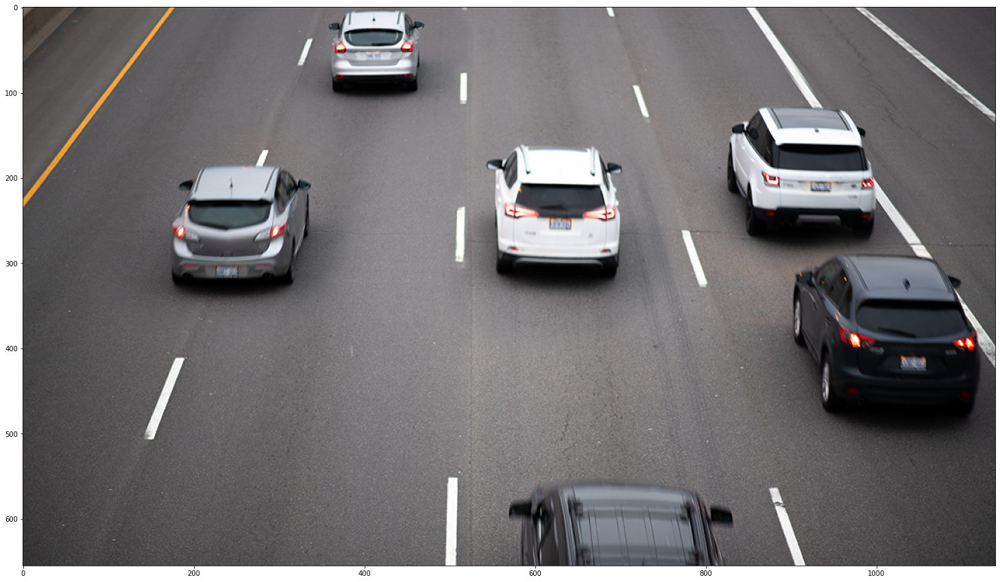

In [12]:
file="imgs/to_test/0.jpg"
frame = np.real(cv.imread(file))
frame = cv.cvtColor(frame, cv.COLOR_BGR2RGB)/255

plt.figure(figsize=(30,15))
    
plt.imshow(frame)

#### Show image sections for a grid overlap of 55%

In [13]:
OVERLAP = .45

# Show Loaded image
#show_img_sections([frame],1,1)

[0, 216, 432, 648, 660] [0, 121, 242, 363, 385]


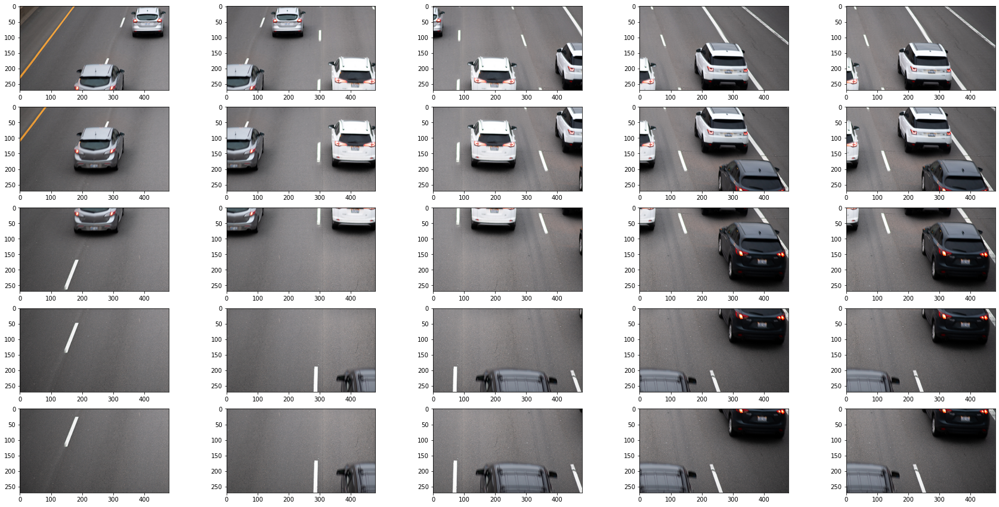

In [14]:

# Grid images based on overlapping value
sections, rows, cols = get_img_sections(frame,OVERLAP)
print(rows,cols)

# Show grid sections
show_img_sections(sections,len(rows),len(cols))

#### Get predictions of bounding boxes

In [15]:
# Get prediction on each section
y, bbox, prob = predict(sections.astype('float64'))

bboxes = get_real_bboxes(bbox,y,cols,rows,filter_neg=False)

#### Plot bounding boxes on image splits

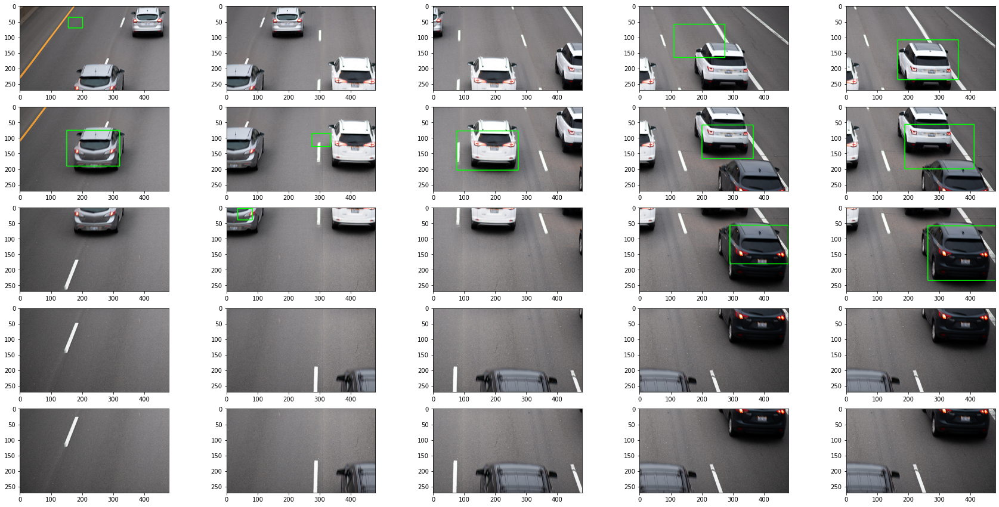

In [16]:
# Show grid sections
show_img_sections(sections,len(rows),len(cols),bboxes=bboxes)

#### plot bounding boxes on inout image

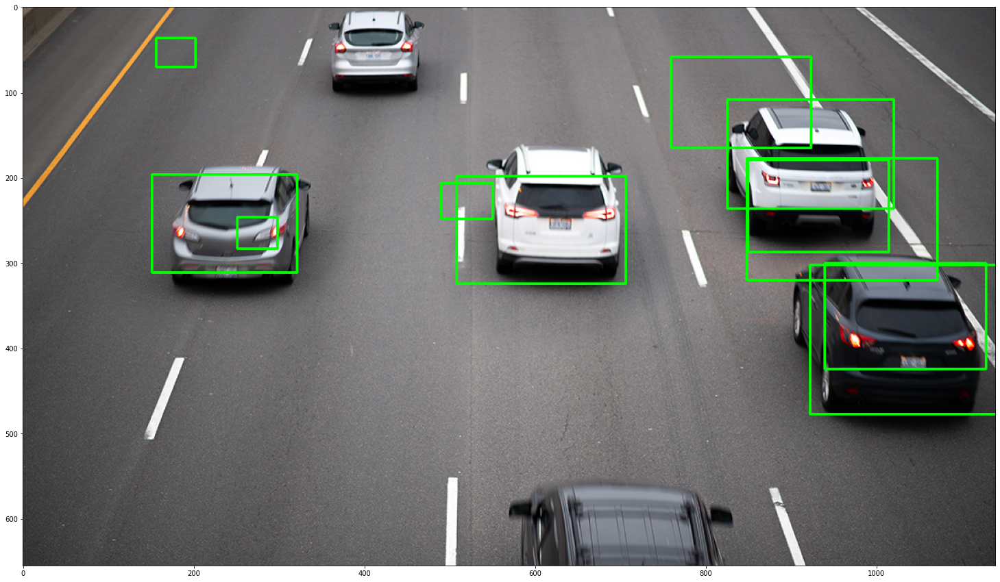

In [17]:
bboxes = get_real_bboxes(bbox,y,cols,rows,filter_neg=True, fh=int(frame.shape[0]), fw=int(frame.shape[1]))

img = plot_bounding_boxes(frame.copy(),bboxes,norm=True)
plt.figure(figsize=(30,15))
plt.imshow(img)

## Merging overlapping bounding boxes

Util functions

In [18]:
# Is Box1 Overlapping Box2 with atleast an area of A_OLAP
def overlap(box1,box2,ovarea=A_OLAP):
    
    x11, y11, x21, y21 = box1
    x12, y12, x22, y22 = box2
    
    overlap_area = ((min(x21+5,x22+5)-max(x11-5,x12-5))*(min(y21+5,y22+5)-max(y11-5,y12-5)))/(((x21+5)-(x11-5))*((y21+5)-(y11-5)))
    
    return x11 < x22 and x12 < x21 and y11 < y22 and y12 < y21 and overlap_area>ovarea, overlap_area   

In [19]:
# Find overlaps in array of bounding boxes for an image
def find_overlaps(bboxes,ovarea=A_OLAP):
    oboxes={}
    merges=[]
    for i in range(len(bboxes)):
        oboxes.setdefault(i,(None,0))
    for i in range(len(bboxes)-1):
        for j in range(i+1,len(bboxes)):
            olap, oarea = overlap(bboxes[i],bboxes[j],ovarea)
            if olap:
                if oboxes[i] == (None,0):
                    oboxes[i] = (j, oarea) 
                elif oboxes[i][1]<oarea:
                    oboxes[i] = (j, oarea)
                else:
                    oboxes[i]= (None,0)
    l = sorted(oboxes.items(), key=lambda x: x[1][1], reverse=True)
    oboxes = {k: v for k, v in l}
    for k,v in l:
        if v[0] not in merges and v[0]!= None:
            merges.append(v[0])
            oboxes[k] = v
        else:
            oboxes[k] = (None,0)
    for i in set(merges):
        oboxes.pop(i)
    return oboxes, len(merges)==0

In [20]:
# Merge all overlapping bounding boces in array of bounding boxes boxes if the overlap is more than area of A_OLAP from box1 to 2
def merge_overlaps(boxes,ovarea=A_OLAP):
    ret = False
    bboxes=boxes.copy()
    while not ret:
        oboxes, ret =find_overlaps(bboxes,ovarea=ovarea)
        for i,j in oboxes.items(): 
            if j[0] != None:
                if j[1]==1.0:
                    j=j[0]
                    bboxes[i]= None
                    x11, y11, x21, y21 = bboxes[j]
                    x11 = x11+(x21-x11)*.1
                    y11 = y11+(y21-y11)*.1
                    x21 = x21-(x21-x11)*.1
                    y21 = y21-(y21-y11)*.1
                else:
                    j=j[0]
                    x11, y11, x21, y21 = bboxes[i]
                    x12, y12, x22, y22 = bboxes[j]
                    x11 = (x11+x12)/2
                    y11 = (y11+y12)/2
                    x21 = (x21+x22)/2
                    y21 = (y21+y22)/2
                    bboxes[i]= [x11, y11, x21, y21]
                    bboxes[j]= None
        bboxes = list(filter(None, bboxes))
    return bboxes

Test for an image
- Find bounding boxes
- merge overlapping bouding boxes

#### Plot Input Image

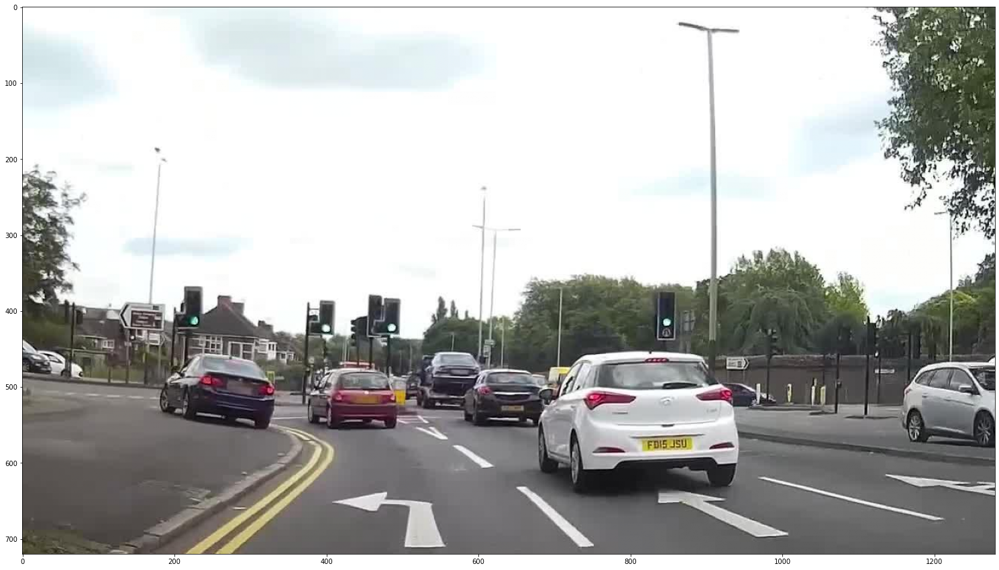

In [21]:
file="imgs/to_test/test.jpg"
frame = np.real(cv.imread(file))
frame = cv.cvtColor(frame, cv.COLOR_BGR2RGB)/255

plt.figure(figsize=(30,15))
    
plt.imshow(frame.copy())

#### Plot predicted bounding boxes

[0, 240, 480, 720, 800]


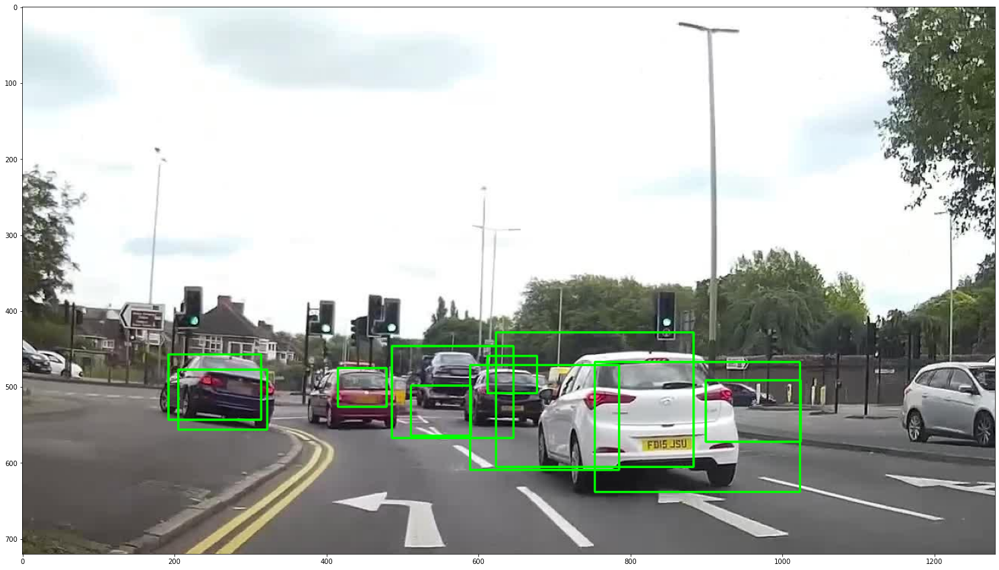

In [22]:
file="imgs/to_test/test.jpg"
frame = np.real(cv.imread(file))
frame = cv.cvtColor(frame, cv.COLOR_BGR2RGB)/255

# Grid images based on overlapping value
sections, rows, cols = get_img_sections(frame,overlap=0.5)
print(rows)

# Get prediction on each section
y, bbox, prob = predict(sections.astype('float64'))

bboxes = get_real_bboxes(bbox,y,cols,rows,filter_neg=True, fh=int(frame.shape[0]), fw=int(frame.shape[1]))

img = plot_bounding_boxes(frame.copy(),bboxes,norm=True)
plt.figure(figsize=(30,15))
plt.imshow(img)

#### Merge bounding boxes and plot on image again

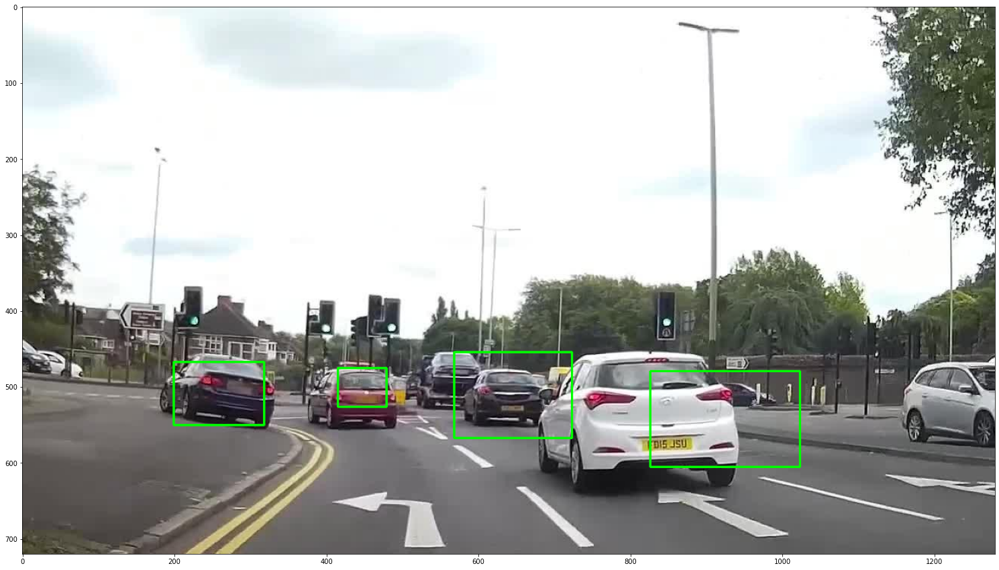

In [23]:
nbboxes = bboxes.copy()
nbboxes = merge_overlaps(nbboxes,ovarea=0.15)

img = plot_bounding_boxes(frame.copy(),nbboxes,norm=True,)
plt.figure(figsize=(30,15))
plt.imshow(img)

### Process a video

### Util functions for video processing

In [24]:
model = tf.keras.models.load_model(MODEL_DIR+''+MODEL_OUT, custom_objects={"IOU": IOU })

model.load_weights(MODEL_DIR+''+WEIGHT_OUT, by_name=False, skip_mismatch=False, options=None)

In [25]:
def rescaleFrame(frame, scale=0.5):
    width = int(frame.shape[1] * scale)
    height= int(frame.shape[0] * scale)
    dims  = (width,height)
    
    return cv.resize(frame, dims, interpolation=cv.INTER_AREA)

In [26]:
def reizeFrame(frame, width, height):
    dims  = (width,height)
    
    return cv.resize(frame, dims, interpolation=cv.INTER_AREA)

In [27]:
def rotateImage(image, angle):
    h, w = image.shape[:2]
    img_c = (w / 2, h / 2)

    rot = cv.getRotationMatrix2D(img_c, angle, 1)

    rad = math.radians(angle)
    sin = math.sin(rad)
    cos = math.cos(rad)
    b_w = int((h * abs(sin)) + (w * abs(cos)))
    b_h = int((h * abs(cos)) + (w * abs(sin)))

    rot[0, 2] += ((b_w / 2) - img_c[0])
    rot[1, 2] += ((b_h / 2) - img_c[1])

    outImg = cv.warpAffine(image, rot, (b_w, b_h), flags=cv.INTER_LINEAR)
    return outImg

In [28]:
def crop_img(img, scale=1.0, right=0, down=0, left=0):
    center_x, center_y = (img.shape[1] / 2) + right, (img.shape[0] / 2) + down
    width_scaled, height_scaled = img.shape[1] * scale, img.shape[0] * scale
    left_x, right_x = center_x - width_scaled / 2, center_x + width_scaled / 2
    top_y, bottom_y = center_y - height_scaled / 2, center_y + height_scaled / 2
    img_cropped = img[int(top_y):int(bottom_y)-200, int(left_x-left):int(right_x)]
    return img_cropped

def crop_sc(img, scale=1.0, right=0, down=0):
    center_x, center_y = (img.shape[1] / 2) + right, (img.shape[0] / 2) + down
    width_scaled, height_scaled = img.shape[1] * 0.75, img.shape[0] * scale
    left_x, right_x = center_x - width_scaled / 2, center_x + width_scaled / 2
    top_y, bottom_y = center_y - height_scaled / 2, center_y + height_scaled / 2
    img_cropped = img[int(top_y):int(bottom_y)-200, int(left_x):int(right_x)-200]
    return img_cropped

In [29]:
OVERLAP = .75

capture = cv.VideoCapture('vids/to_test/input/test.MP4')
cont = capture.isOpened()

fh=IMG_HEIGHT*2
fw=IMG_WIDTH*2

fno = 100000
while cont:
    isTrue, frame = capture.read()
    if not isTrue:
        break
        
    frame = frame/255
    #frame = crop_img(frame,right=200,down=200)
    #frame = cv.resize(frame, (int(frame.shape[0]*.5),int(frame.shape[1]*.5)), interpolation=cv.INTER_AREA)
    #frame = rotateImage(frame,0) 
    frame = rescaleFrame(frame,0.8)
    
    fno+=1
    #if fno%100==0:
    #    print(fno)
    #if fno<1200:
    #    continue
    
    fh=int(frame.shape[0])
    fw=int(frame.shape[1])
    
    # Grid images based on overlapping value
    sections, rows, cols = get_img_sections(frame,OVERLAP)

    # Get prediction on each section
    y, bbox, prob = predict(sections.astype('float64'))
    
    bboxes = get_real_bboxes(bbox,y,cols,rows,filter_neg=False)
    #show_img_sections(sections,len(rows),len(cols),bboxes=bboxes)
    
    #for i in range(len(sections)):
    #    if y[i] == 1 and bboxes[i] != [0,0,0,0] and prob[i][1]>=.95:
    #        cv.imwrite(f'imgs/to_label/{fno}_{i}_{y[i]}.jpg', sections[i]*255)
    
    bboxes = get_real_bboxes(bbox,y,cols,rows,filter_neg=True, fh=int(frame.shape[0]), fw=int(frame.shape[1]))
    bboxes = merge_overlaps(bboxes,ovarea=0.01)
    
    frame = plot_bounding_boxes(frame,bboxes,norm=True,label=True)
    
    cv.imshow('image', frame)
    
    key = cv.waitKey(25) & 0xFF
    
    if key == ord("q") or key == 27:
        capture.release
        cv.destroyAllWindows()
        cont = False
        break
        
capture.release
cv.destroyAllWindows()

In [30]:
capture.release
cv.destroyAllWindows()

In [31]:
OVERLAP = .75

capture = cv.VideoCapture('vids/to_test/input/test.MP4')
cont = capture.isOpened()
isTrue, frame = capture.read()
frame = rescaleFrame(frame,0.8)

fno = 0
fh=int(frame.shape[0])
fw=int(frame.shape[1])

filename=f"vids/to_test/output/output.mp4"
fourcc = cv.VideoWriter_fourcc(*'MP4V')
out = cv.VideoWriter(filename, fourcc, 20.0, (frame.shape[1],frame.shape[0]))

print('Exporting',end='')
while cont and isTrue:
    isTrue, frame = capture.read()
    if not isTrue:
        break
        
    frame = frame/255
    frame = rescaleFrame(frame,0.8)
    fno+=1
    
    # Grid images based on overlapping value
    sections, rows, cols = get_img_sections(frame,OVERLAP)

    # Get prediction on each section
    y, bbox, prob = predict(sections.astype('float64'))

    bboxes = get_real_bboxes(bbox,y,cols,rows,filter_neg=False)
    #show_img_sections(sections,len(rows),len(cols),bboxes=bboxes)
    
    bboxes = get_real_bboxes(bbox,y,cols,rows,filter_neg=True, fh=int(frame.shape[0]), fw=int(frame.shape[1]))
    bboxes = merge_overlaps(bboxes,ovarea=0.1)
    
    frame = plot_bounding_boxes(frame,bboxes,norm=True,label=True)
    
    #cv.imshow('image', frame)
    out.write(frame)
    
    key = cv.waitKey(25) & 0xFF
    
    if key == ord("q") or key == 27:
        capture.release
        cv.destroyAllWindows()
        cont = False
        break
    
    if fno%30==0:
        print('.', end='')
        
print(' Complete')
                    
capture.release
out.release()
cv.destroyAllWindows()

Exporting........................................................... Complete


In [32]:
capture.release
out.release()
cv.destroyAllWindows()